# Advanced Lane Finding
### Stephen Giardinelli

## Camera Calibration
In order to calibrate the camera I iterated through the images in the "camera_cal" folder and ran them through the openCV function to find the corners.  The corners could not be found on all images, but those few image were skipped.  I then used the openCV function to generate the distortion coefficients and camera matrix, which were then stored in a pickle dictionary for future reference.  The image below demonstrates the effect of camera calibration.


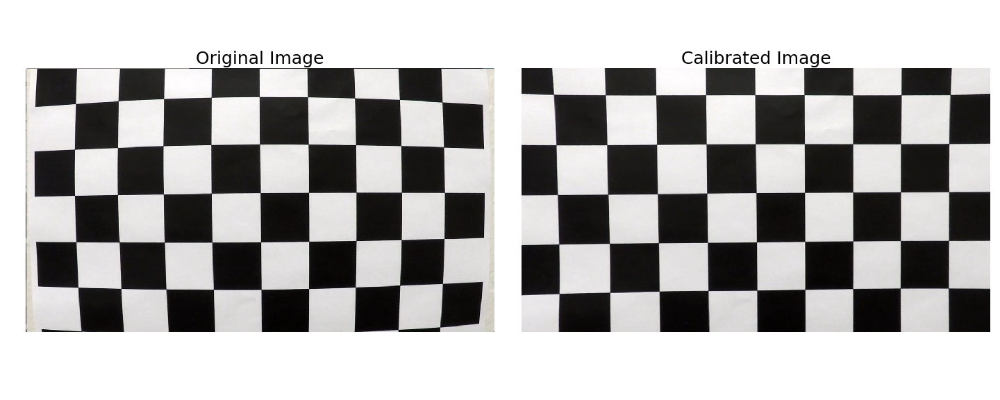

## Image Pipeline
### 1. Distortion Correction
In order to correct for distortion in the image, I used the camera matrix and distortion coefficients calculated in the camera calibration steps.  With those values, I was able to used the openCV undistort() function to correct for camera distortion.

### 2. Cropping
In the video for this project, the hood of the car is visible so I cropped it out as it is unneccessary.  I did this by cutting out the bottom 50 rows of pixels so that I am left with a 1280x670 image.

### 3. Image Mask/ROI
Just like in the first lane line project, we only car about the seciton of the image that contains the lane lines.  In order to apply the image mask I found the 4 vertices of a polygon that included the lane and left room for lane curvature.  Every pixel outside of the polygon was set to black.

### 4. Perspective Transform
In order to measure curvature and accurately fit lines with a polynomial regression, we need to have a bird's-eye view of the lane in front of the vehicle.  In order to accomplish this I used the openCV getPerspectiveTransform() and warpPerspective() funcitons.  In order to find the source and destination vertices, I opened an image of a straight lane in GIMP, and assummed the lane was perfectly straight and perfectly flat.  I took points on each lane line near the bottom of the image and the top of the line.  These 4 vertices mapped out an isosceles trapezoid on the image, but from a bird's-eye persepective I knew it should be a rectangle.

#### Steps 1-4 are visualized in the following figure:
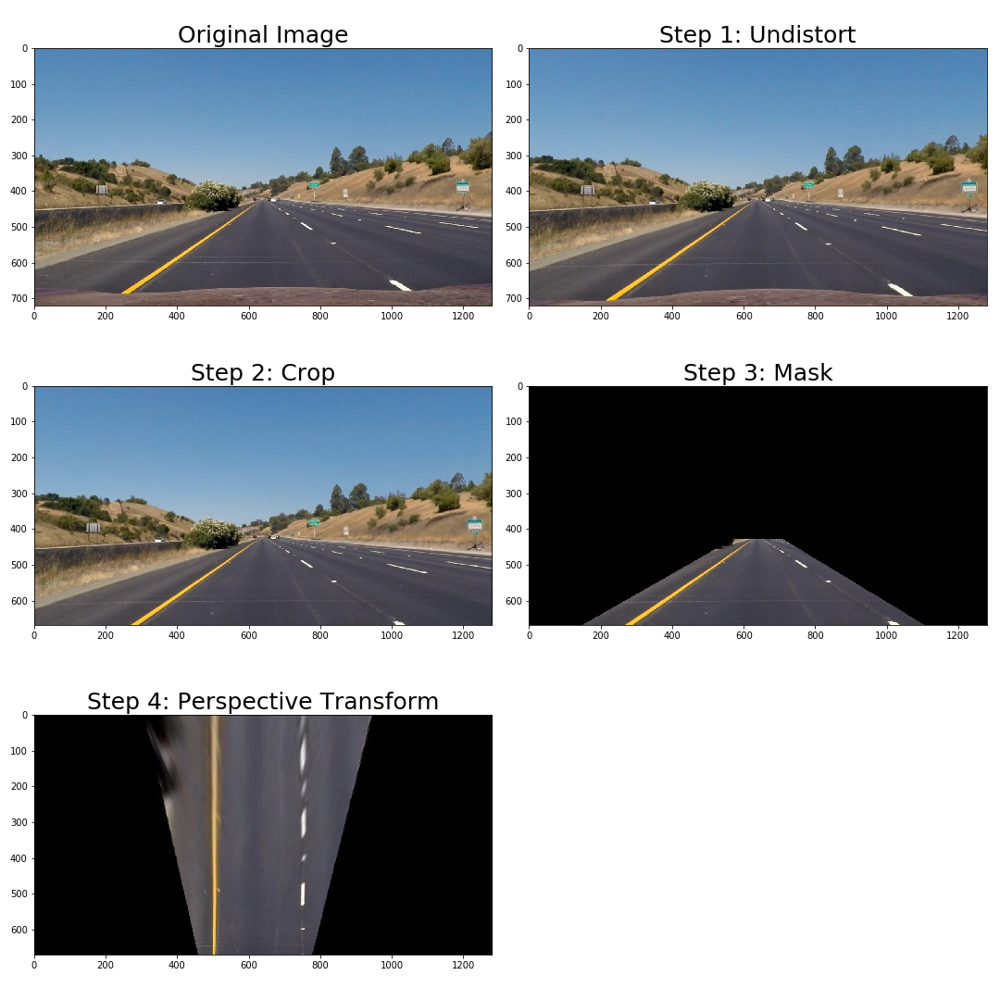

### 5. Colorspace Experiments
In order to detect lane lines in the image, I knew I would have to visualize the image in many different colorspaces in order to find the channels that provided enough contrast between lane lines and the road so that I could threshold the values.  The following image shows 3 images visualized in RGB, HSV, HLS, LAB, and YCrCb.  Each channel for each colorspace is shown in grayscale in order to visualize.

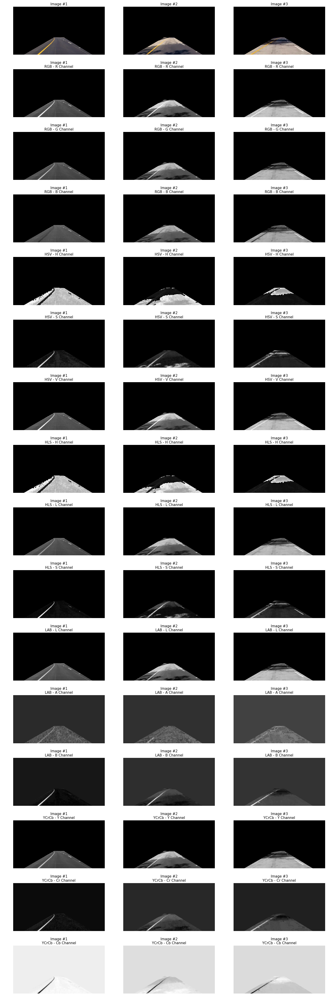

In the above figure, I noticed that the HLS - S channel provided a lot of contrast for the yellow lines and some contrast for the white lines.  The HLS - L channel provided a lot of contrast for just the white lines. And the LAB - B channel provided a lot of contrast for the yellow line only.  Now I had to determine threshold values for each channel.  After many iterations, I came out with the following thresholds:
    - HLS - S Channel: (175, 255)
    - HLS - L Channel: (205, 255)
    - LAB - B Channel: (145, 255)
    
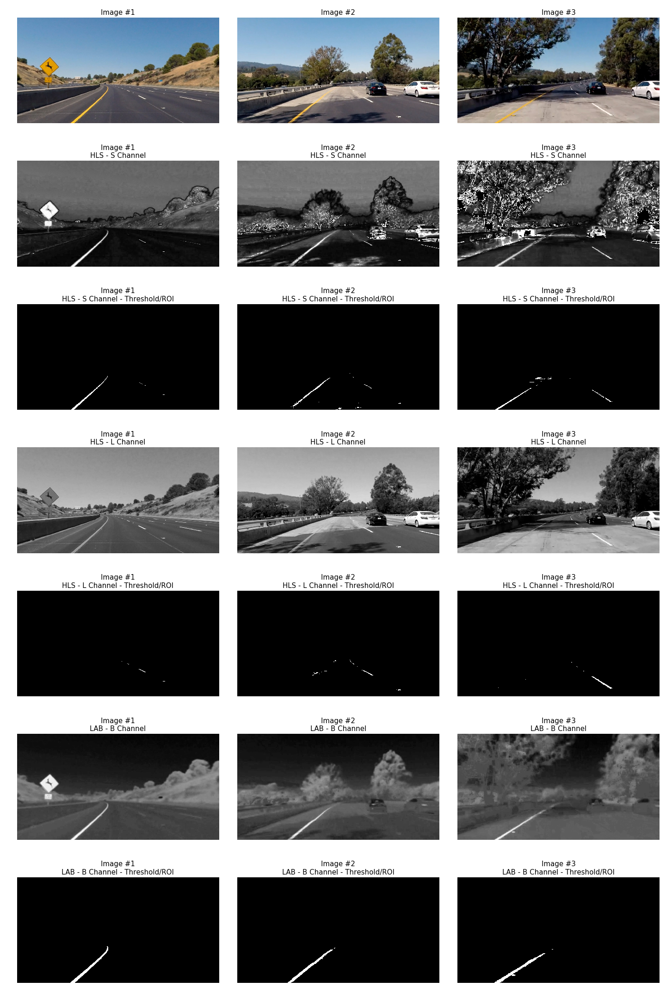

### 6. Gradient Experiments
The next step was to explore how well the gradients in each the X and Y direciton could do with detecting lane lines.  For this part, I calculated the gradient in the X direction and Y direction with the Sobel operator, and then scaled the value from 0-255 in order to visualize it in a grayscale image.  I then began experimenting with difftered thresholds to see if I could filter out the noise and detect the lines.  This process can be visualized in the figure below.

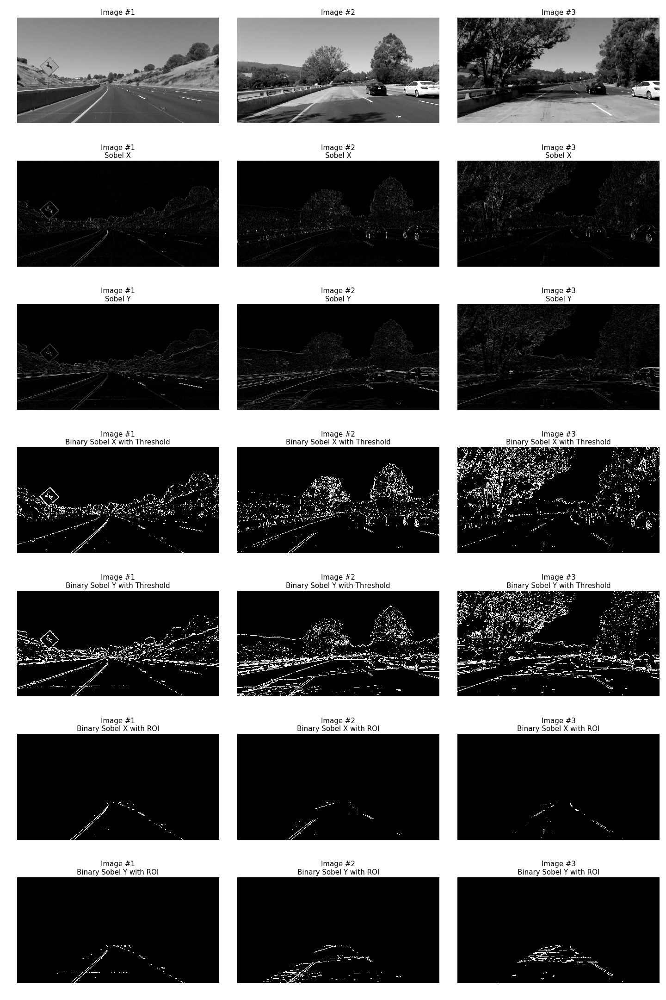

Here I noticed that the gradient in the X direction was much more effective at detecting the lines while ignoring a lot of the other detections in the image.  So I edned up using the gradient in the X direction, thresholded at (50,150)

### 7. Combining Colorspaces and Gradient
In order to achieve a robust detection of lane lines in these iamges, I needed to combine the colorspace channels and X gradient.  I ended up omitting the HLS - S channel because the LAB - B channel was better at detecting the yellow lines, and the HLS - L channel was better at detecting the white lines and the S - channel was just adding too many false detections.  So my final combination was:

    - HLS - L Channel: (205, 255)
    - LAB - B Channel: (145, 255)
    - Sobel X: (50,150)
    
I applied the detection of all three to all 8 test images.  In the figure below we have the detections visualized in certain colors:
    
    - Sobel X: (50,150): Red
    - LAB - B Channel: Blue
    - HLS - L Channel: Green
    
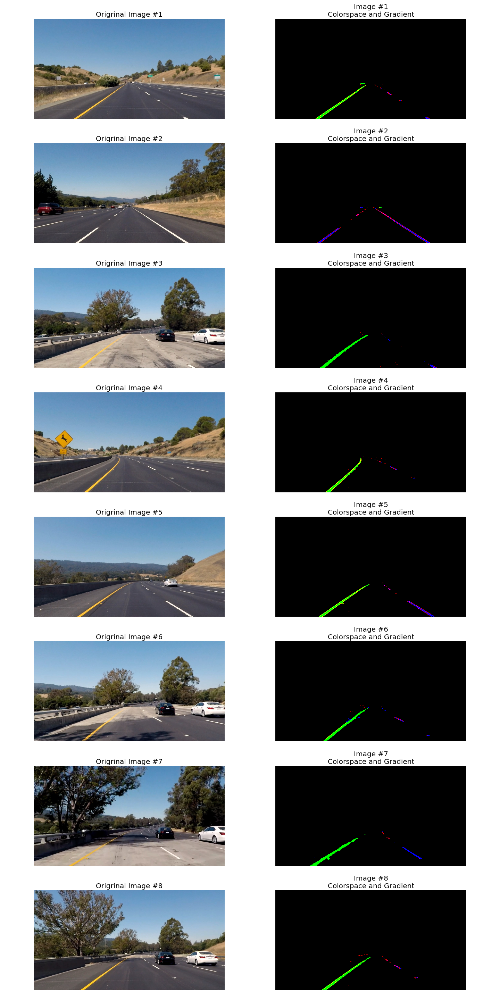
    
Then I applied the perspective transform to see a birds eye view...

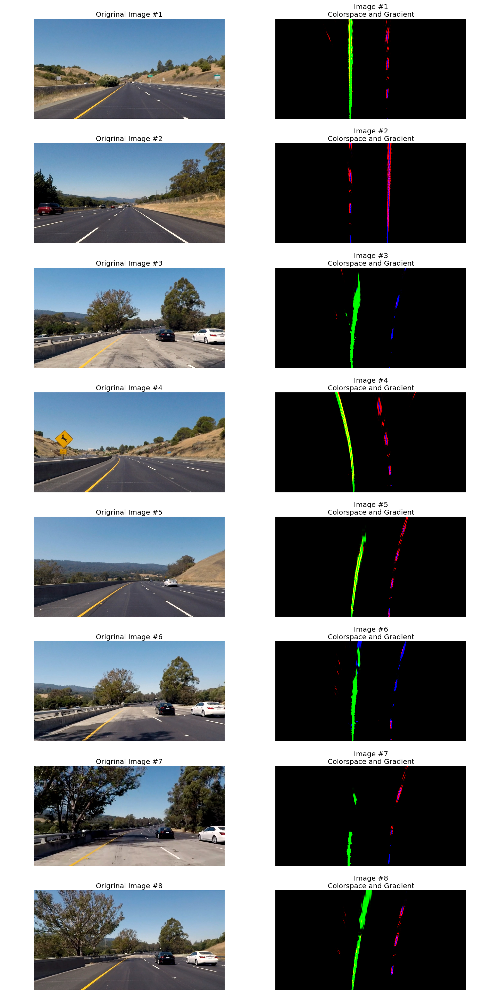

### 8. Sliding Window Search
Now that I had detections displayed in a binary image from a bird's-eye perspective, I was ready to fit a line to the detections with a second order polynomial regression.  In order to do this I needed to filter out the line detections from the false detections.  To start I calculated a histogram of all detections across the bottom half of the image.  I then found the two peaks and associated their ex values with the starting point of the lane lines at the base of the image.  From there I performed a sliding window search to filter good detections from bad detections.  I used a margin of 50 and minimum pixel threshold of 50 as well.  I then used the good detections to fit a second order polynomial for each the right and left lane line.  This process can be visualized in the image below.

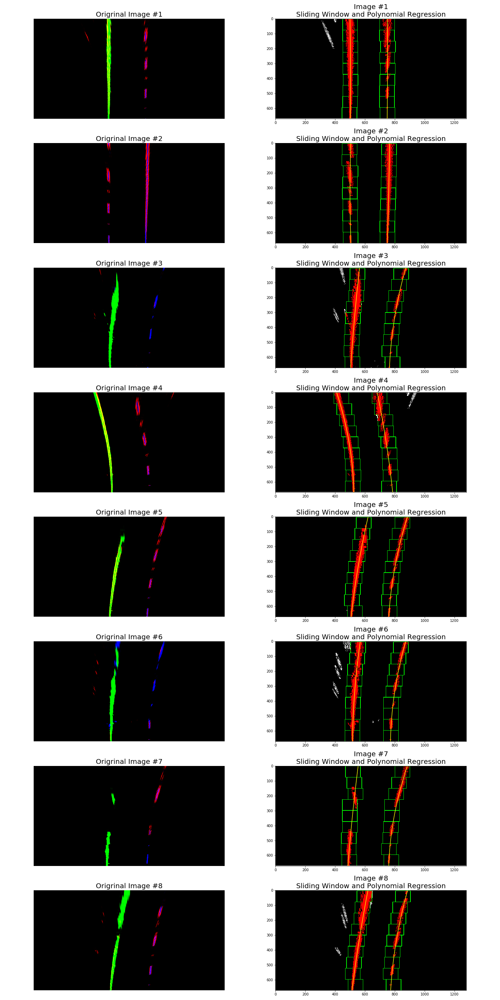

### 9. Radius of Curvature and Distance from Center of Lane
With polynomials fit to the each the left and right lane lines, I wrote a function to calculate the curvature of each line and the distance offset between the center of the car and the center of the lane.  Since we have the equation:

    - f(y) = Ay^2 + By + C
    - f'(y) = 2AY + B
    - f''(y) = 2A
    
And the radius of curvature can be found with:
    - R = ((1+(2Ay+B)^2)^1.5)/|2A|
    
In order to find the distance between the car and the center of the lane, I assumed that the car "center location" was exactly the midpoint of the image.  In order to fid the midpoint of the lane, I evaluated the equation for each line fit at the bottom of the image.  This cave me the two X-intercepts at the bottom of the image so I calculated the average of those values or "center point" of the road and subracted it from the vehicle center point.  For both the radius of curvature and distance offset I had to scale from Pixels to meters, which I did by analyzing images in the bird's eye perspective In gimp and converting from pixels to meters.

### 10. Drawing the Lane On the Original Image
The final step is to draw the lane back down on the image.  In oder to do this I used th poly-fit lines to fill in the area betweent both lines.  Once I had a solid shape, I "unwarped" the image using the inverse transform matrix.  Finally, I combined the two images with openCV's addWeighted() function to overlay the lane on the original image.  I also printed the curvature and distance data in the upper left hand corner of the image.

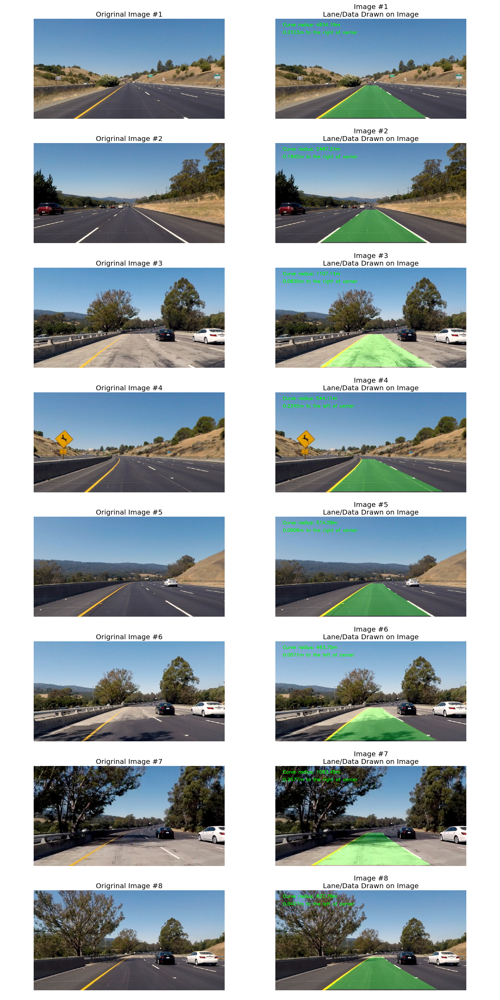

## Video

[Here is a Link to my Output Video](video_output/project_video_out.mp4)

## Discussion

In order to tackle this project, I applied the following pipeline to each frame:

    - Undisort image with camera calibration information
    - Crop out the bottom 50 rows of pixels to eliminate the hood of the car
    - Apply an image mask to highlight the ROI
    - Apply a perspective transform to get a bird's-eye view of the lane
    - Use the HLS-L channel, LAB-B channel, and Sobel X information to identify lane line pixels
    - Perform a sliding window search to find the line pixels and filter out some noise
        - For successive frames I used the line as a search basis for new pixels instead of the sliding window
    - Fit a line to the lane line detections with a polynomial regression
    - Calculate the lane curvature and distance offset from the vehicle to the center of the lane
    - Draw the lane on the image
    - Perform an inverse perspective transform to return to the original camera perspective
    - Draw the curvature and distance data on the image
    - Save frames as output video
    
Overall the algortihm performed fairly well.  There a few frames on light pavement where the line fit deviates a small amount from the acutal lane curvature, however it is quickly corrected.  The most time consuming part of this project was finding the proper color channels and sobel operator and applying threshold values these outputs.  It was difficult and rather subjective to pick values that detected lane line pixels while not returning too many false detections.  If this project were to fail in certain scenarios, I would assume the failure would occur in situations were the lane lines are occluded or subject to unique lighting and pavement colors. If I were to continue this project I would work to improve these detections on many different road surfaces in order to make the lane line detection more robust to different lighting conditions and pavement types.
    